# Задание

### Основная часть

* Проанализируйте и опишите данный датасет, используя все возможные графики из тех, что были на уроке Matplotlib, Seaborn, Plotly
* Используйте также описательные статистики
* У каждого построенного графика должен быть соответствующий вывод, который описывает наблюдение или инсайт

# Описания полей

* age	возраст
* gender	пол repexc_date
* city_type	Тип города проживания клиента
* full_mob	Длительность взаимоотношений с банком

* ml_balance	ипотека
* cl_balance_0m	потребительский кредит
* loan_balance_0m	все кредиты

* td_balance_0m	депозит
* casa_balance_0m	счета

* dc_trx_cnt	количество трат по картам
* dc_trx_sum	сумма трат по картам
* Avg_trx	средний размер транзакции
* avgtrx_to_balance	


* min_casa_balance_1q	показатели по счетам за квартал
* max_casa_balance_1q	
* avg_casa_balance_1Y	показатели по счетам за год

* min_td_balance_1q	
* max_td_balance_1q	
* avg_td_balance_1Y

* min_loan_balance_1q	
* max_loan_balance_1q	
* avg_loan_balance_1Y

* min_cl_balance_1q	
* max_cl_balance_1q	
* avg_cl_balance_1Y	
* loan_to_deposit	

* income	доход клиента
* nbi	доход от клиента без OPEX

In [1]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
from tqdm.auto import tqdm

In [6]:
df = pd.read_csv('test_cluster.csv', encoding='cp1251', sep=';')
df.head()

,age,gender,city_type,full_mob,ml_balance,cl_balance_0m,loan_balance_0m,td_balance_0m,casa_balance_0m,dc_trx_cnt,...,min_loan_balance_1q,max_loan_balance_1q,avg_loan_balance_1Y,min_cl_balance_1q,max_cl_balance_1q,avg_cl_balance_1Y,loan_to_deposit,Avg_trx,avgtrx_to_balance,nbi
0,71,NaN,<100,103,0.0,0.0,0.0,0.0,0.0000,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
1,49,NaN,Mega,81,0.0,0.0,0.0,0.0,3272.9367,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,28.762952
2,56,NaN,Mega,81,0.0,0.0,0.0,0.0,6249.7550,6,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,854.67,0.083467,1973.335539
3,47,NaN,Mega,81,0.0,0.0,0.0,0.0,14354.9370,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,364.008556
4,74,NaN,Mega,81,0.0,0.0,0.0,0.0,91511.7691,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,6651.416562


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  50000 non-null  int64  
 1   gender               49277 non-null  object 
 2   city_type            50000 non-null  object 
 3   full_mob             50000 non-null  int64  
 4   ml_balance           50000 non-null  float64
 5   cl_balance_0m        50000 non-null  float64
 6   loan_balance_0m      50000 non-null  float64
 7   td_balance_0m        50000 non-null  float64
 8   casa_balance_0m      50000 non-null  float64
 9   dc_trx_cnt           50000 non-null  int64  
 10  dc_trx_sum           50000 non-null  float64
 11  income               50000 non-null  float64
 12  min_casa_balance_1q  50000 non-null  float64
 13  max_casa_balance_1q  50000 non-null  float64
 14  avg_casa_balance_1Y  50000 non-null  float64
 15  min_td_balance_1q    50000 non-null 

In [8]:
len(df)

50000

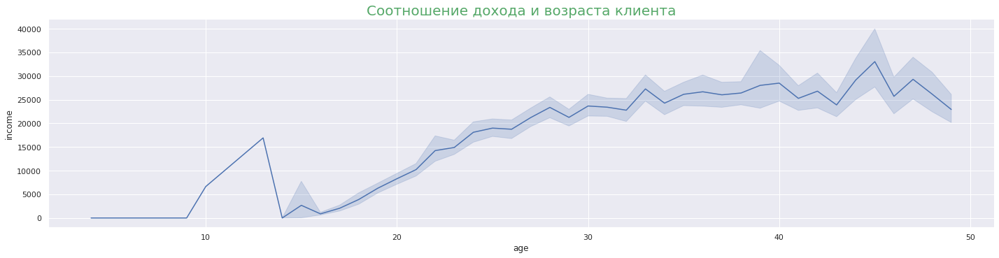

In [9]:
sns.set(style='darkgrid')  

sns.relplot(
    x='age', 
    y='income', 
    data=df.query('age < 50'), 
    kind='line',
    aspect=4
)
plt.title('Соотношение дохода и возраста клиента', size=20, color='g');

В основном доход клиентов до 50 не превышает 40000 и с каждым годом повышается


In [10]:
df['full_mob'].unique()

array([103,  81,  50,  56,  13, 154, 165,  40,   3,  37, 156,  63,  52,
        10, 152,  26,   9,  78,  68,  49, 141,  34,  22,   0, 157,  11,
        99,  29, 108,  90,  27,   1,  75,  30,  84, 117,  54,  74,  79,
       105,  42,  12,  16,   2,  21,  24,  46,  18,  94,  33,  14, 128,
        36,  44,  80,  35,  67,  62, 102,  41,   6,  23,  53,   5,  85,
       158, 104,  25,  39,  15,  20,  88,  55,  66,  98,  72,   4,  73,
         8, 101, 106, 137,  38, 166,  76,   7,  17, 124,  31,  92, 134,
        93,  19,  58,  89, 135, 123, 139,  70, 167,  69, 160, 120,  32,
       111, 145,  28,  51,  64,  82, 163, 122,  59, 144, 162,  48, 140,
        57, 107, 109,  43, 100, 161, 142, 129,  77,  86, 151, 121, 148,
        61, 118, 159, 115, 125,  65,  60, 110,  91, 150, 132,  95, 164,
       136, 153, 131, 146,  87,  71, 133, 176, 127,  97, 155, 138,  47,
       130,  45, 143, 168, 114,  83, 172, 149, 147, 116, 126, 112, 169,
       113,  96, 178, 119, 173, 181, 170, 236, 171, 174, 185, 21

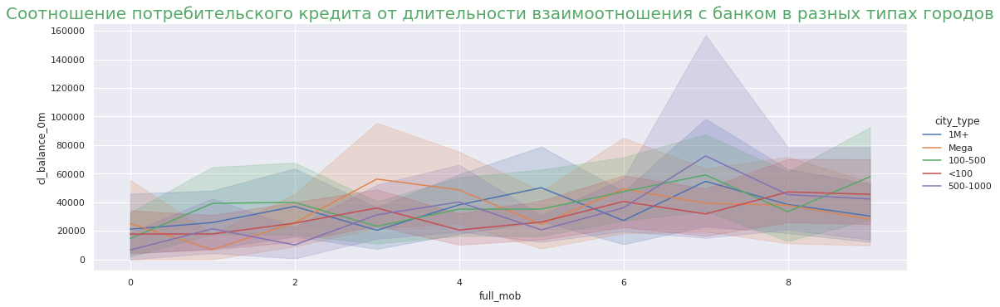

In [11]:
sns.relplot(
    x='full_mob', 
    y='cl_balance_0m', 
    hue='city_type', 
    data=df.query('full_mob < 10'), 
    kind='line',
    aspect=3)
plt.title('Соотношение потребительского кредита от длительности взаимоотношения с банком в разных типах городов', 
          size=20, color='g');

На графике видна динамика, что от времени общения с банком возрастает сумма кредита. Важно отметить, что города с минимальным количеством человек не остатет от сумм кредитов.


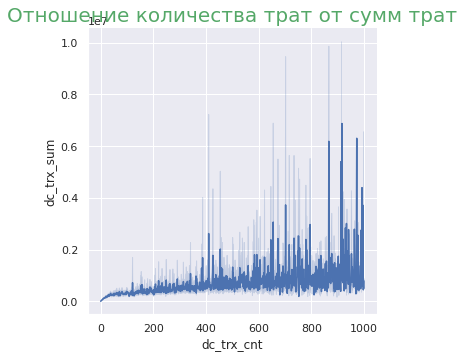

In [12]:
sns.relplot(
    x='dc_trx_cnt', 
    y='dc_trx_sum', 
    data=df.query('dc_trx_cnt < 1000'), 
    kind='line'
)
plt.title('Отношение количества трат от сумм трат', size=20, color='g');

Чем дороже покупки, тем больше трат делает клиент.

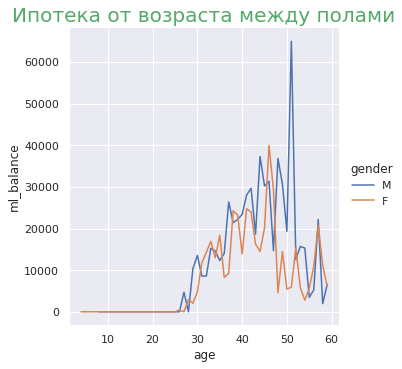

In [13]:
sns.relplot(
    x='age',
    y='ml_balance', 
    hue='gender', 
    dashes=True,
    markers=True,
    data=df.query('age < 60'), 
    kind='line', 
    ci=None)
plt.title('Ипотека от возраста между полами', size=20, color='g');

Чем старше человек, тем более большую ипотеку он берет. Причем после 50 объем ипотеки значительно меньше

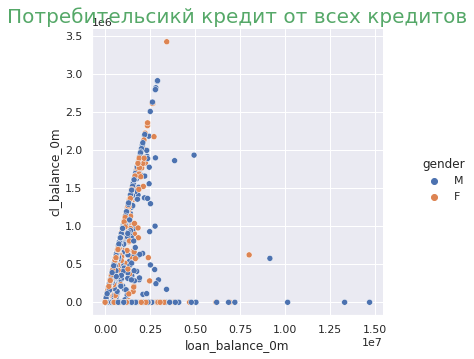

In [14]:
sns.relplot(
    x='loan_balance_0m',
    y='cl_balance_0m', 
    hue='gender', 
    data=df)
plt.title('Потребительсикй кредит от всех кредитов', size=20, color='g');

Линейная зависимость потребительского кредита от всех кредитов клиента.

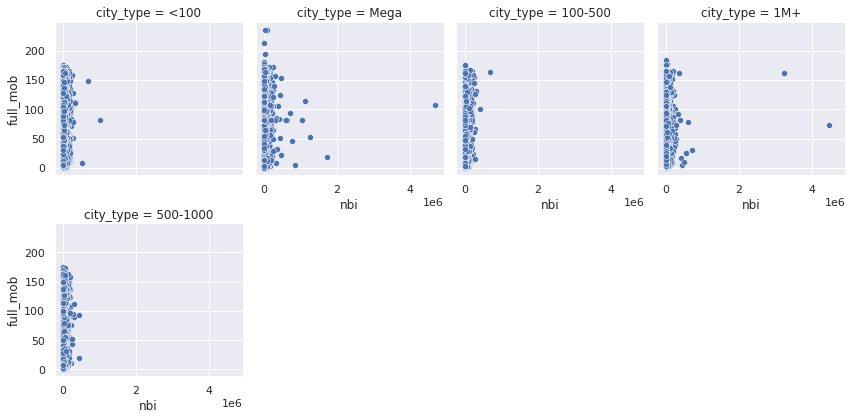

In [15]:
sns.relplot(
    x='nbi',
    y='full_mob',
    col='city_type',
    col_wrap=4,
    data=df,
    height=3
);

Доход без ОРЕХ не зависит от длительности общения с банком.

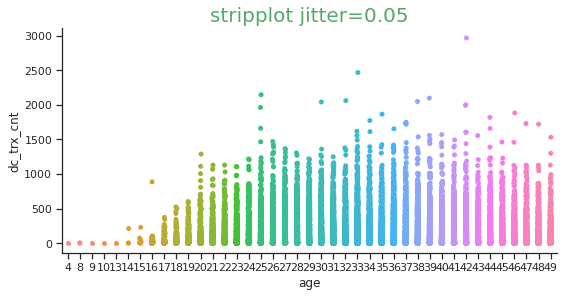

In [17]:
sns.set(style="ticks", color_codes=True)

sns.catplot(
    x='age',
    y='dc_trx_cnt', 
    data=df.query('age < 50'),   
    jitter=0.05,
    height=4, 
    aspect=2, 
    kind='strip', 
    dodge=True)
plt.title('Количество трат в зависимости от возраста', size=20, color='g');

С возраста от 25 до 50 количество трат примерно одинаковое.

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 67.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 84.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 88.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 88.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 91.8% of the points cannot be placed; y

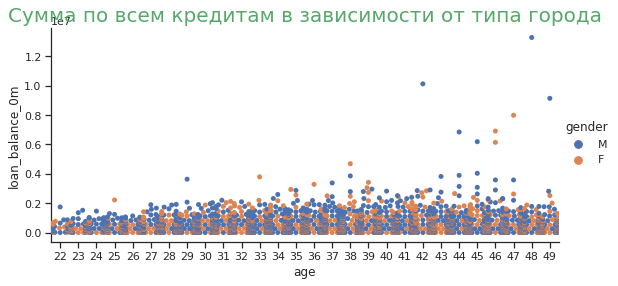

In [22]:
sns.catplot(
    x='age',
    y='loan_balance_0m', 
    data=df.query('loan_balance_0m > 0 and age < 50'),
    hue='gender',
    kind='swarm',
    height=4, 
    aspect=2)
plt.title('Сумма по всем кредитам в зависимости от возраста', size=20, color='g');

Сумма кредитов от 25 до 50 лет у всех примерно одинаковые.

In [23]:
df['min_casa_balance_1q']

0            0.0000
1         3272.9367
2         6249.7550
3        14354.9370
4        91511.7691
            ...    
49995        0.8800
49996        0.0000
49997     3795.8800
49998     3078.0000
49999      389.4100
Name: min_casa_balance_1q, Length: 50000, dtype: float64

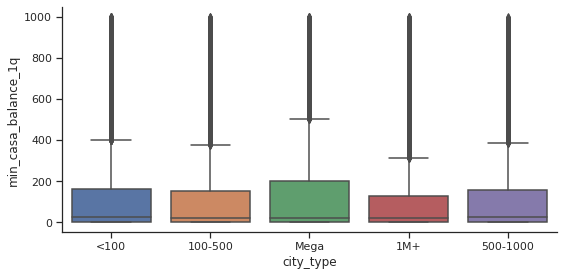

In [27]:
sns.catplot(
    x='city_type', 
    y='min_casa_balance_1q', 
    data=df.query('min_casa_balance_1q < 1000'), 
    kind='box',  
    height=4, 
    aspect=2); 

Показатели по счетам за квартал не намного, но больше в типе города Mega, в основном они практически идентичны.

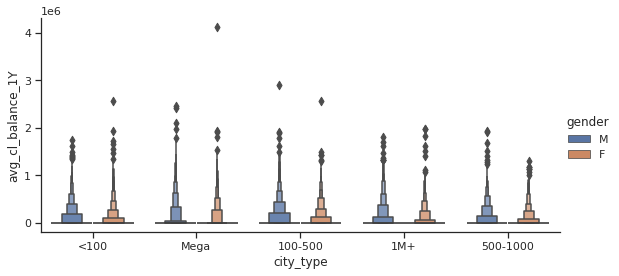

In [29]:
sns.catplot(
    x='city_type', 
    y='avg_cl_balance_1Y', 
    data=df, 
    kind='boxen', 
    hue='gender', 
    height=4, 
    aspect=2); 

Средние показатели по счетам за год в разных типах городов практически одинаковы. Также можно заметить, что траты мужчин, немного больше чем у женщин.

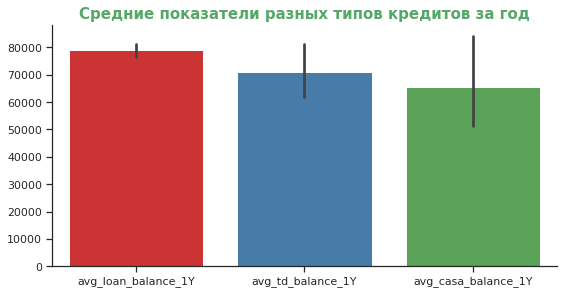

In [33]:
sns.catplot(
    data=df, 
    kind='bar', 
    height=4, 
    aspect=2,   
    order=['avg_loan_balance_1Y', 'avg_td_balance_1Y', 'avg_casa_balance_1Y'],
    palette="Set1"
); 
plt.title('Средние показатели разных типов кредитов за год', size=15, color='g', 
          weight='bold');

Заемные кредиты клиентов примерно на 100000 превышает депозитный. В свою очередь, депозитный кредит где-то на 50000 превышает ипотечный кредит.

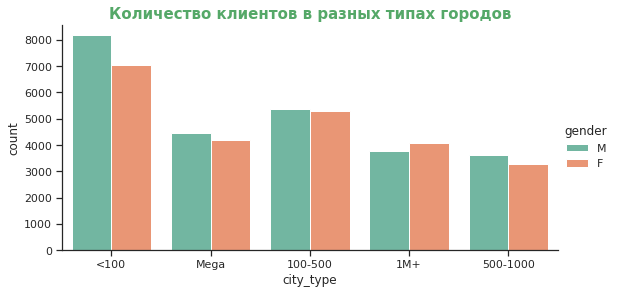

In [38]:
sns.catplot(
    x='city_type', 
    data=df, 
    kind='count', 
    hue='gender', 
    palette="Set2",  
    height=4, 
    aspect=2);
plt.title('Количество клиентов в разных типах городов', size=15, color='g', weight='bold');

Наибольшее количество клиентов в городах, с населением меньше 100 человек.

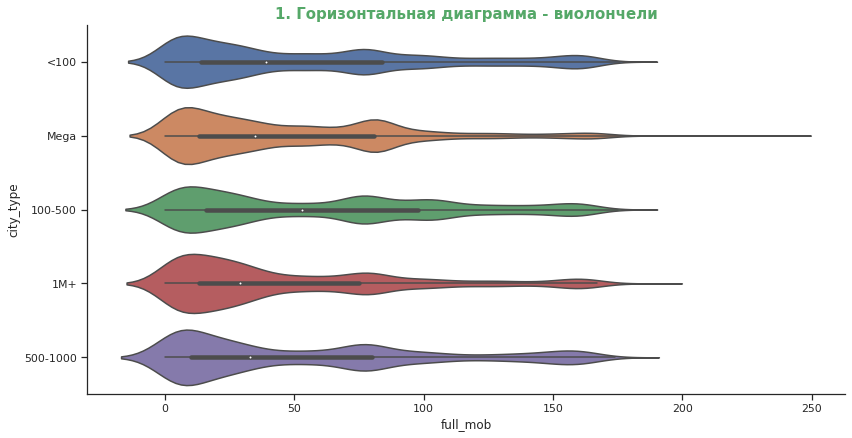

In [52]:
sns.catplot(
    x='full_mob',
    y='city_type',
    data=df,
    kind='violin',
    height=6,
    aspect=2)
plt.title('Отношение типа города к длительности общения с клиентом', size=15, color='g', weight='bold');

Клиенты из разных городов имеют примерно одинаковое распределение длительности общения с банком.

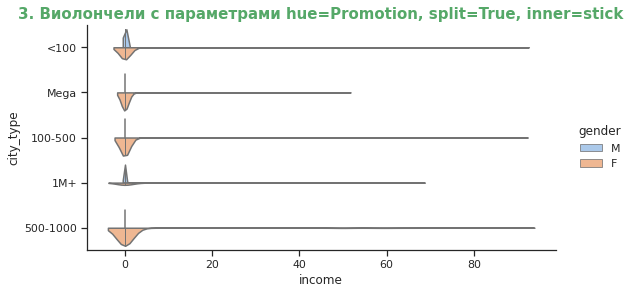

In [55]:
sns.catplot(
    x='income', 
    y='city_type', 
    data=df.query('income < 100'), 
    kind='violin', 
    hue='gender',  
    split=True, 
    inner="stick", 
    palette="pastel",
    height=4, 
    aspect=2)
plt.title('Отношение типа корода к доходу до 100', size=15, color='g', weight='bold');

В осномном доходов больше у мужчин в начелении от 500 до 1000.

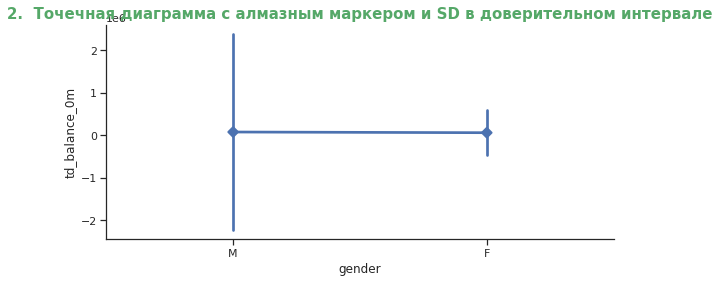

In [57]:
sns.catplot(
    x='gender', 
    y='td_balance_0m', 
    data=df,
    kind='point', 
    markers='D', 
    ci='sd',
    height=4, 
    aspect=2)  
plt.title('Отношение пола к депозиту', size=15, color='g', weight='bold');

Депозитный счет намного превышает у мужчин, чем у женщин.


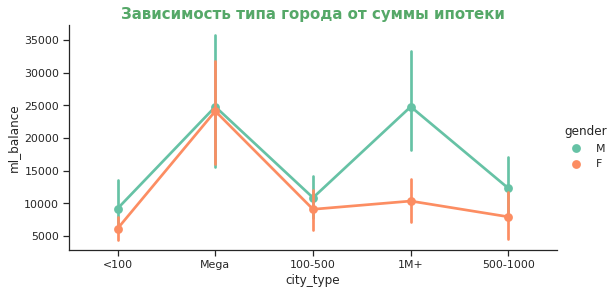

In [60]:
sns.catplot(
    x='city_type', 
    y='ml_balance', 
    data=df, 
    kind='point', 
    hue='gender',
    dodge=False, 
    palette="Set2", 
    height=4, 
    aspect=2)
plt.title('Зависимость типа города от суммы ипотеки', size=15, color='g', weight='bold');

Самые большие ипотеки берут в городах Mega и 1М+, причем в городах 1М+ в основном это мужчины.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


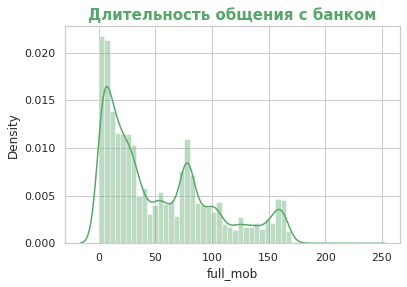

In [66]:
sns.set(style='whitegrid', color_codes=True)

sns.distplot(
    df.full_mob,
    color='g', 
    rug=False, 
    rug_kws={"color": 'm', "height": 0.1}
)
plt.title('Длительность общения с банком', size=15, color='g', weight='bold')
plt.show();

В основном - большинство клиентов общаются вначале, остаются с банком лишь 50%.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


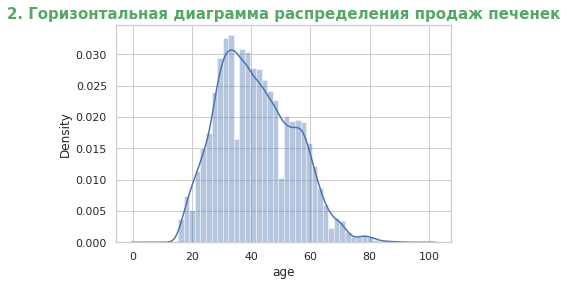

In [71]:
sns.distplot(
    df.age,
    vertical=False,    
)           
plt.title('2. Горизонтальная диаграмма распределения продаж печенек', size=15, color='g', weight='bold')             
plt.show();

Большинство клиентов банка в возрасте ~ 30 лет.

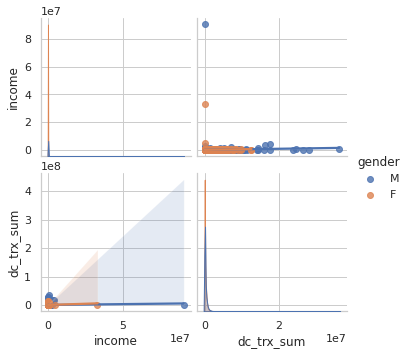

In [79]:

sns.pairplot(
    df,
    vars=['income', 'dc_trx_sum'],
    hue='gender', kind='reg')
plt.show();

Трат намного меньше чем доходов у клиентов.

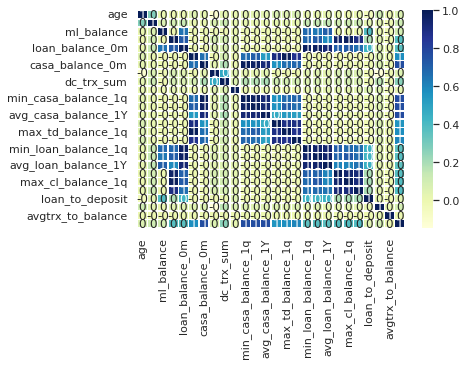

In [102]:
corr = df.corr()

sns.heatmap(
    corr, 
    annot=True, 
    fmt='.0f',
    linewidths=.5, 
    cmap="YlGnBu")

Наибольшая корреляция между показателями по счетам за кварталы.

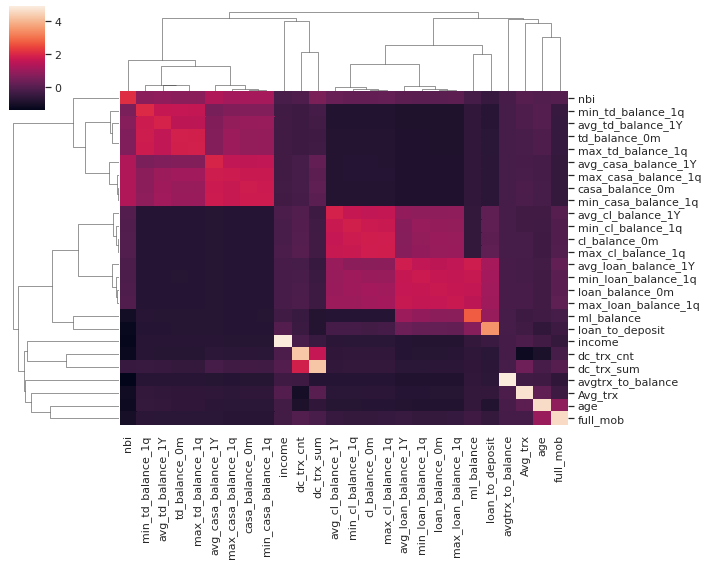

In [104]:
g = sns.clustermap(
    corr, 
    figsize=(10,8),  
    z_score=1)

In [115]:
import plotly.express as px
fig = px.scatter(df.query('income < 1000000 and casa_balance_0m < 1000000'), x="income", y="casa_balance_0m")
fig.show()

Большинтсво тех, у кого доход меньше 100000 имеет очень большие денежные счета.

In [124]:
fig = px.bar(df, x="age", y="avg_loan_balance_1Y", pattern_shape_sequence=[".", "x", "+"])
fig.show()

У 39 летних наиболее большие средние заемные счета.

In [127]:
fig = px.funnel(df, x='city_type', y='gender')
fig.show()

In [128]:
fig = px.pie(df, values='income', names='city_type')
fig.show()

Самы большие доходы у клиентов в городах, где проживает меньше 100 человек


In [136]:
fig = px.line_polar(df, r="Avg_trx", theta="city_type", line_close=True,
            color_discrete_sequence=px.colors.sequential.Plasma_r)
fig.show()

Самые больше средние расходы в городе с населенностью меньше 100.

In [142]:
fig = px.violin(df, y="casa_balance_0m", x="city_type", box=True, points="all", hover_data=df.columns)
fig.show()

Самые большие счета в городах, с начелением Mega.